In [1]:
!pip install -q git+https://github.com/huggingface/peft.git transformers bitsandbytes datasets

In [2]:
from datasets import load_dataset 

dataset = load_dataset("SKyu/my-image-captioning-dataset", split = "train",)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/parquet/SKyu--my-image-captioning-dataset-bd2085680cef8356/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


In [3]:
print(dataset)

Dataset({
    features: ['image', 'prompt'],
    num_rows: 3100
})


In [4]:
dataset[0]["prompt"]

'a large building next to a body of water, conceptual rendering, rendering of checkmate, detailed renderings, dramatic rendering, detailed rendering, sharp hq rendering, futuristic architectural art, artists impression, futuristic sport arena, photoralistic rendering, artistic rendering, architecture render ”, in style of norman foster, artist impression, in style of zaha hadid architect, beautiful rendering'

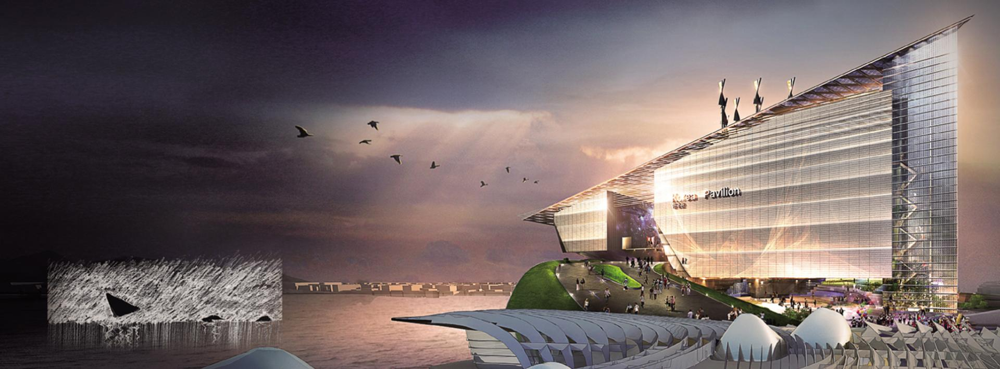

In [5]:
dataset[0]["image"]

In [6]:
from torch.utils.data import Dataset, DataLoader

class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        encoding = self.processor(images=item["image"], padding="max_length", return_tensors="pt")
        encoding = {k: v.squeeze() for k, v in encoding.items()}
        encoding["text"] = item["prompt"]
        return encoding

def collate_fn(batch):
    processed_batch = {}
    for key in batch[0].keys():
        if key != "text":
            processed_batch[key] = torch.stack([example[key] for example in batch])
        else:
            text_inputs = processor.tokenizer(
                [example["text"] for example in batch], padding=True, return_tensors="pt"
            )
            processed_batch["input_ids"] = text_inputs["input_ids"]
            processed_batch["attention_mask"] = text_inputs["attention_mask"]
    return processed_batch


In [7]:
from transformers import AutoProcessor, Blip2ForConditionalGeneration

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("ybelkada/blip2-opt-2.7b-fp16-sharded", device_map="auto", load_in_8bit=True)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

In [8]:
from peft import LoraConfig, get_peft_model

# Let's define the LoraConfig
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, config)
model.print_trainable_parameters()

trainable params: 5,242,880 || all params: 3,749,922,816 || trainable%: 0.13981301102065136


In [9]:
train_dataset = ImageCaptioningDataset(dataset, processor)
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=8, collate_fn=collate_fn)

In [10]:
print(train_dataset)

In [11]:
print(len(train_dataloader))

388


In [12]:
import torch

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

device = "cuda" 

model.train()

for epoch in range(50):
    print("Epoch:", epoch)
    for idx, batch in enumerate(train_dataloader):
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device, torch.float16)

        outputs = model(input_ids=input_ids,
                        pixel_values=pixel_values,
                        labels=input_ids)

        loss = outputs.loss
        if idx % 50 == 0:
            print("Batch: ", idx, " Loss:", loss.item())

        loss.backward()

        optimizer.step()
        optimizer.zero_grad()
        
        p = pixel_values.cpu().detach()
        del p
        i = input_ids.cpu().detach()
        del i

Epoch: 0
Batch:  0  Loss: 4.5
Batch:  50  Loss: 3.0234375
Batch:  100  Loss: 2.41796875
Batch:  150  Loss: 2.37109375
Batch:  200  Loss: 1.755859375
Batch:  250  Loss: 1.7802734375
Batch:  300  Loss: 1.8291015625
Batch:  350  Loss: 2.10546875
Epoch: 1
Batch:  0  Loss: 1.7802734375
Batch:  50  Loss: 1.603515625
Batch:  100  Loss: 1.6640625
Batch:  150  Loss: 1.5859375
Batch:  200  Loss: 1.5517578125
Batch:  250  Loss: 1.3974609375
Batch:  300  Loss: 1.57421875
Batch:  350  Loss: 1.1689453125
Epoch: 2
Batch:  0  Loss: 1.1416015625
Batch:  50  Loss: 1.421875
Batch:  100  Loss: 1.4453125
Batch:  150  Loss: 1.482421875
Batch:  200  Loss: 1.291015625
Batch:  250  Loss: 1.32421875
Batch:  300  Loss: 1.21484375
Batch:  350  Loss: 1.2734375
Epoch: 3
Batch:  0  Loss: 1.1708984375
Batch:  50  Loss: 1.3955078125
Batch:  100  Loss: 0.98828125
Batch:  150  Loss: 1.248046875
Batch:  200  Loss: 1.25
Batch:  250  Loss: 1.2294921875
Batch:  300  Loss: 1.42578125
Batch:  350  Loss: 1.123046875
Epoch: 4
B

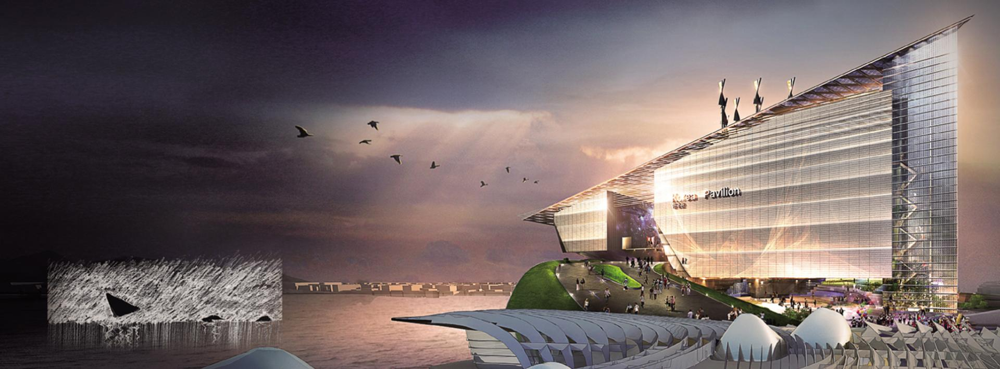

In [13]:
example = dataset[0]
image = example["image"]
image

In [14]:
inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
pixel_values = inputs.pixel_values

generated_ids = model.generate(pixel_values=pixel_values, max_length=25)
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_caption)

The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when using `accelerate`. Please pass a `device_map` that contains `language_model` to remove this warning. Please refer to https://github.com/huggingface/blog/blob/main/accelerate-large-models.md for more details on creating a `device_map` for large models.


a large building next to a body of water, conceptual rendering, detailed renderings, rendering of checkmate, detailed rendering


In [15]:
from huggingface_hub import notebook_login

notebook_login()

In [17]:
model.push_to_hub("Shrey23/Image-Captioning")

adapter_model.safetensors:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/Shrey23/Image-Captioning/commit/1c34d963e4de44d1f7b601378b2b57ebdf6baf7d', commit_message='Upload model', commit_description='', oid='1c34d963e4de44d1f7b601378b2b57ebdf6baf7d', pr_url=None, pr_revision=None, pr_num=None)

In [18]:
from transformers import Blip2ForConditionalGeneration, AutoProcessor
from peft import PeftModel, PeftConfig

peft_model_id = "Shrey23/Image-Captioning"
config = PeftConfig.from_pretrained(peft_model_id)

model = Blip2ForConditionalGeneration.from_pretrained(config.base_model_name_or_path, load_in_8bit=True, device_map="auto")
model = PeftModel.from_pretrained(model, peft_model_id)

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when using `accelerate`. Please pass a `device_map` that contains `language_model` to remove this warning. Please refer to https://github.com/huggingface/blog/blob/main/accelerate-large-models.md for more details on creating a `device_map` for large models.
The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when using `accelerate`. Please pass a `device_map` that contains `language_model` to remove this warning. Please refer to https://github.com/huggingface/blog/blob/main/accelerate-large-models.md for more details on creating a `device_map` for large models.
The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when us

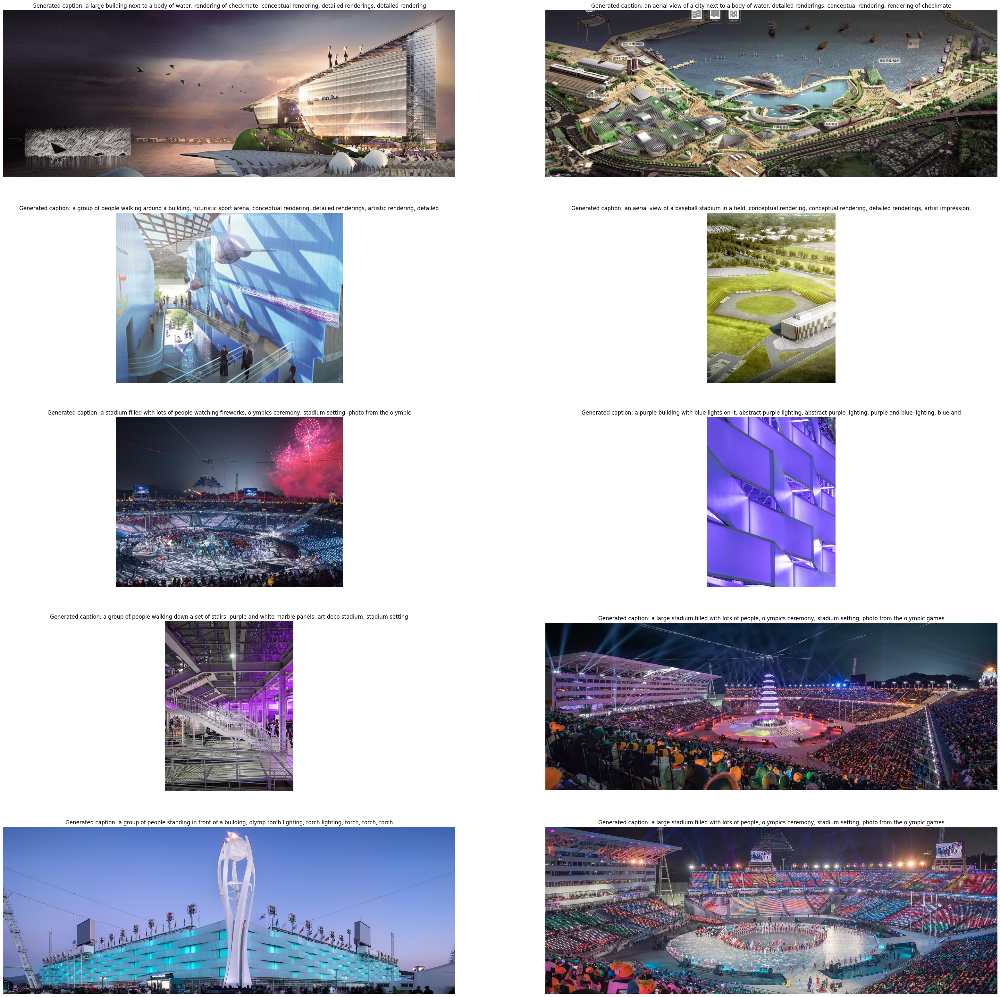

In [26]:
import torch
from matplotlib import pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

fig = plt.figure(figsize=(40, 40))

# prepare image for the model
for i, example in enumerate(dataset):
    if i == 10:
        break
    image = example["image"]
    inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=25)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    fig.add_subplot(5, 2, i+1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Generated caption: {generated_caption}")